# Read Image


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2

# PATH = "drive/My Drive/PY/2020_Projects/ImgAnalysis/"
PATH = './'
FILE = "PenguinNoise(1).bmp"
FILE_orig = "PenguinOriginal(1).bmp"

# read distorted image and original image
img = cv2.imread(os.path.join(PATH,FILE), cv2.IMREAD_GRAYSCALE).astype("float")
img_orig = cv2.imread(os.path.join(PATH,FILE_orig), cv2.IMREAD_GRAYSCALE).astype("float")

print(img.shape,img_orig.shape) # show shape

(342, 512) (342, 512)


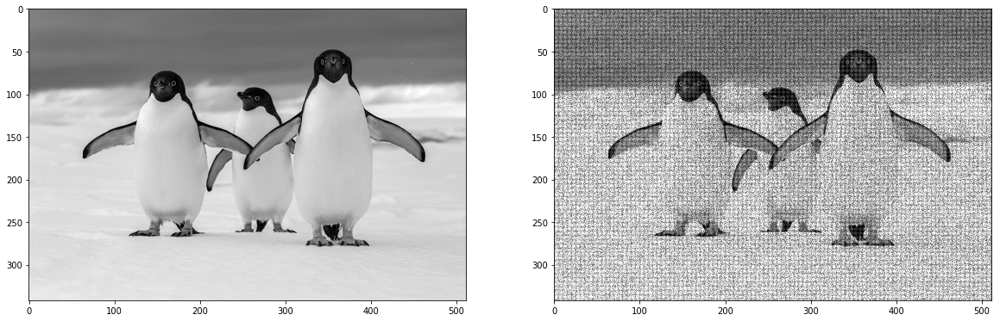

In [ ]:
# plot images in grayscale
plt.figure(figsize=(20, 10))
plt.subplot(121),plt.imshow(img_orig, cmap="gray")
plt.subplot(122),plt.imshow(img, cmap="gray")
plt.show()

# Scaler (normarlizer)

In [ ]:
img.min(),img.max() # image greyscale value needs to normarlize to 0,255

(0.0, 244.0)

In [ ]:
# Scaler methods to normalise image
def minMaxScaler(X,min=0,max=255): # use min-max scale method
    X = X.astype("float")
    X_std = (X - X.min()) / (X.max() - X.min())
    X_scaled = X_std * (max - min) + min
    return X_scaled

# Metrics 

## Reference

In [ ]:
# Mean suqred error (MSE) 
def mse(img_1, img_2):
    return np.sum((img_1-img_2) ** 2)/(img_1.shape[0]*img_1.shape[1])

# root mean-squared error (NRMSE) (0-1), higher the NRMSE, the bigger the difference 
from skimage.metrics import normalized_root_mse
def nrmse(img_1, img_2):
    return normalized_root_mse(img_1, img_2)

#SSIM (0-1), higher the SSIM, higher similarity
from skimage.metrics import structural_similarity
def ssim(img_1, img_2):
    return structural_similarity(img_1, img_2, data_range=img_2.max() - img_2.min())

# peak signal to noise ratio (PSNR) higher the PSNR, the higher the similarity. Infinate value refers to the identical images
from skimage.metrics import peak_signal_noise_ratio
def psnr(img_1, img_2):
    return peak_signal_noise_ratio(img_1.astype('uint8'), img_2.astype('uint8'), data_range=None)

# test on (input image, reference image)
print(mse(img, img_orig), mse(minMaxScaler(img),minMaxScaler(img_orig)))
print(nrmse(img, img_orig), nrmse(minMaxScaler(img), minMaxScaler(img_orig)))
print(ssim(img, img_orig), ssim(minMaxScaler(img), minMaxScaler(img_orig)))
print(psnr(img, img_orig), psnr(minMaxScaler(img), minMaxScaler(img_orig)))

1731.1934450383771 1637.0098710294849
0.25249601344808764 0.23494003066417898
0.12945934276206494 0.1261138227616369
15.747347618436134 15.996509841445075


## No reference

In [ ]:
# DOM Sharpness
# Sharpness Estimation for Document and Scene Images
from dom import DOM
iqa = DOM()
def iqaSharp(img):
    return iqa.get_sharpness(img.astype('uint8'))

print(iqaSharp(img), iqaSharp(img_orig))
print(iqaSharp(minMaxScaler(img)), iqaSharp(minMaxScaler(img_orig))) 

1.130340009677289 0.857711518054563
1.130165835798138 0.8575070149356673


In [ ]:
# Blind/Referenceless Image Spatial Quality Evaluator (BRISQUE) 
# use support vector regression model trained on other distortion image dataset  
# the more distoration，the higher Brisque value 
import imquality.brisque
def brisque(img):
    try:
        res = imquality.brisque.score(img.astype('float32'))
    except:
        res = 'Error'
    return res
print(brisque(img),brisque(img_orig))
print(brisque(minMaxScaler(img)),brisque(minMaxScaler(img_orig))) 

132.0262631023876 8.180074429275436
132.0262631023876 8.177686379141818


In [ ]:
# get all metric
from tqdm import tqdm
def getAll(img_lists, img_2):
    names = ['MSE', 'NRMSE', 'SSIM', 'PSNR', 'DOM (Non-Ref)', 'Brisque (Non-Ref)']
    metrics = []
    for img_1 in tqdm(img_lists):
        img_1 = minMaxScaler(img_1)
        img_2 = minMaxScaler(img_2)
        res = [mse(img_1, img_2), nrmse(img_1, img_2), ssim(img_1, img_2), psnr(img_1, img_2), \
               iqaSharp(img_1), brisque(img_1)]
        metrics.append(res)
    return pd.DataFrame(metrics, columns=names)

In [ ]:
df_res.to_csv('metrics.csv')

In [ ]:
# Print aLL metrics in one method
def printAll(img_1, img_2): 
# first column is the original value, the second column uses a graylevel scaler on the img_1 only.
# the img_2 is the reference image which is not scaled, since it is the "test set" or "perfect image")
    print("MSE:", mse(img_1, img_2), "Scaled MSE:", mse(minMaxScaler(img_1),img_2))
    print("NRMSE:", nrmse(img_1, img_2), "Scaled NRMSE:",nrmse(minMaxScaler(img_1), img_2))
    print("SSIM:",ssim(img_1, img_2), "Scaled SSIM:", ssim(minMaxScaler(img_1),img_2))
    print("PSNR:",psnr(img_1, img_2), "Scaled PSNR:", psnr(minMaxScaler(img_1),img_2))
    print("IQA sharpness:",iqaSharp(img_1), "Scaled Sharpness:", iqaSharp(minMaxScaler(img_1)),"Ref:",iqaSharp(img_2))
    print("Brisque:",brisque(img_1), "Scaled Brisque:", brisque(minMaxScaler(img_1)),"Ref:",brisque(img_2))
printAll(img, img_orig)

MSE: 1731.1934450383771 Scaled MSE: 1594.8524539974928
NRMSE: 0.25249601344808764 Scaled NRMSE: 0.23189512964240694
SSIM: 0.12945934276206494 Scaled SSIM: 0.1253759244224986
PSNR: 15.747347618436134 Scaled PSNR: 16.065427006074206
IQA sharpness: 1.130340009677289 Scaled Sharpness: 1.130165835798138 Ref: 0.857711518054563
Brisque: 132.02548987523573 Scaled Brisque: 132.0262631023876 Ref: 8.180074429275436


# Fourier Transform
In cv2's fourier transform results, the first channel will have the real part of the result and second channel will have the imaginary part of the result. The input image should be converted to np.float32 first.

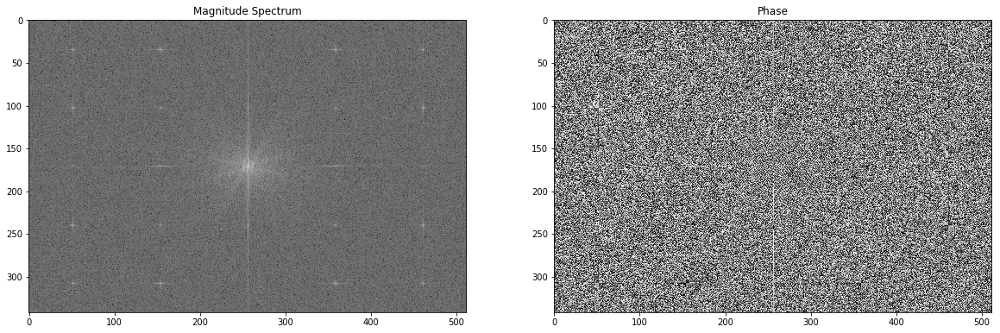

In [ ]:
# Transform image from spatial to frequency domain
dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)
# shift DC low freqency part to center
dft_shift = np.fft.fftshift(dft) 

mag, phase = cv2.cartToPolar(dft_shift[:,:,0], dft_shift[:,:,1])
#combine real & imaginary part, log tansform for better visualization
mag_spectrum = np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1])+1)  # plus 1 to avoid log(0)

fig = plt.figure(figsize=(20,15))
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(np.log(mag+1), cmap = 'gray')
ax1.title.set_text('Magnitude Spectrum')
ax2 = fig.add_subplot(1,2,2)
ax2.imshow(phase, cmap = 'gray')
ax2.title.set_text('Phase')
plt.show()

In [ ]:
# the loss of the same img -> fft, shift, ishift, idft 
dft_ishift = np.fft.ifftshift(dft_shift)
img_same = cv2.idft(dft_ishift)
img_same_comb = cv2.magnitude(img_same[:,:,0],img_same[:,:,1])
mse(minMaxScaler(img_same_comb),minMaxScaler(img))

2.6474351605137702e-09

### CV2 Low Pass Filter


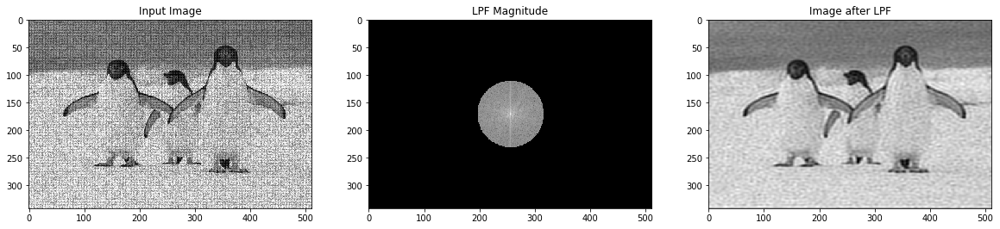

MSE: 216.40870099077335 Scaled MSE: 216.40870099077335
NRMSE: 0.08191445369566963 Scaled NRMSE: 0.08191445369566963
SSIM: 0.5879542068550452 Scaled SSIM: 0.5879542068550452
PSNR: 24.763229896819055 Scaled PSNR: 24.763229896819055
IQA sharpness: 0.9334535710439779 Scaled Sharpness: 0.9334535710439779 Ref: 0.857711518054563
Brisque: 46.26978383668066 Scaled Brisque: 46.26978383668066 Ref: 8.180074429275436


In [ ]:
row, col = img.shape
row_c, col_c = int(row/2), int(col/2) # get the center coordinates
mask = np.zeros((row,col,2),np.uint8) # init mask with zeros

# square mask
# mask_size=60
# mask[row_c-mask_size:row_c+mask_size, col_c-mask_size:col_c+mask_size] = 1

# Circle mask (improve 30 mse compare to sqaure)
x, y = np.ogrid[:row, :col]
mask_size = 60  # radis
mask_circle = (x-row_c)**2 + (y-col_c)**2 < mask_size**2 # Pythagorean theorem
mask[mask_circle] = 1

# apply LPF
dft_shift_mask = dft_shift * mask
#combine real and imaginary value, use log transformation to increase range 
mag_mask = np.log(cv2.magnitude(dft_shift_mask[:,:,0],dft_shift_mask[:,:,1])+1) # for visulization of specturm only

# inverse shifting 
dft_ishift = np.fft.ifftshift(dft_shift_mask)
# inverse transform into spatial image
img_low = cv2.idft(dft_ishift)
#combine real and imaginary value
img_low = cv2.magnitude(img_low[:,:,0],img_low[:,:,1])
img_low = minMaxScaler(img_low)

plt.figure(figsize=(20, 15))
plt.subplot(131),plt.imshow(img, cmap = 'gray')
plt.title('Input Image')
plt.subplot(132),plt.imshow(mag_mask, cmap = 'gray')
plt.title('LPF Magnitude')
plt.subplot(133),plt.imshow(img_low, cmap = 'gray')
plt.title('Image after LPF')
plt.show()
printAll(img_low, img_orig)

### CV2 High Pass Filter

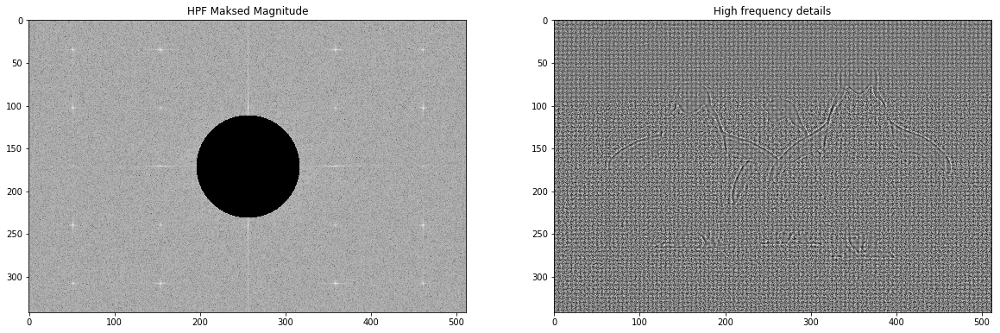

In [ ]:
# Try a High pass mask
mask = np.ones((row,col,2),np.uint8)
x, y = np.ogrid[:row, :col]
mask_size = 60
mask_circle = (x-row_c)**2 + (y-col_c)**2 < mask_size**2
mask[mask_circle] = 0

dft_shift_hpf = dft_shift * mask
mag_mask_hpf = np.log(cv2.magnitude(dft_shift_hpf[:,:,0],dft_shift_hpf[:,:,1]+1))

dft_ishift = np.fft.ifftshift(dft_shift_hpf)

img_high = cv2.idft(dft_ishift)
# img_high = cv2.magnitude(img_high[:,:,0],img_high[:,:,1])
img_high = minMaxScaler(img_high[:,:,0])

plt.figure(figsize=(20, 15))
plt.subplot(121),plt.imshow(mag_mask_hpf, cmap = 'gray')
plt.title('HPF Maksed Magnitude')
plt.subplot(122),plt.imshow(img_high, cmap = 'gray')
plt.title('High frequency details')
plt.show()

### CV2 Notch Filter

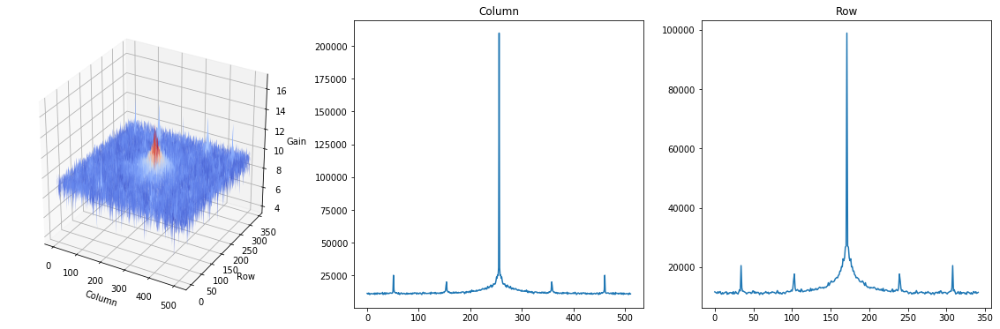

In [ ]:
# In order to design a notch filter, the frequency of period noise need to be identified
# First, look at the spectrum in 3d and 2d perspectives
# And then remove the DC peak, and try to find the noise peak
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

X, Y = np.meshgrid(range(col), range(row)) # intialise x,y aixs

fig = plt.figure(figsize=(20, 6))
ax = fig.add_subplot(131, projection='3d')
ax.set_xlabel('Column'), ax.set_ylabel('Row'), ax.set_zlabel('Gain')
ax.plot_surface(X, Y, np.log(mag+1), cmap=cm.coolwarm, linewidth=0, antialiased=True) # show fourier spectrum in 3D
ax1 = fig.add_subplot(132)
ax1.plot(mag.mean(axis=0)) # view from col dimention 
ax1.title.set_text('Column')
ax2 = fig.add_subplot(133)
ax2.plot(mag.mean(axis=1)) # view from the row dimention
ax2.title.set_text('Row')

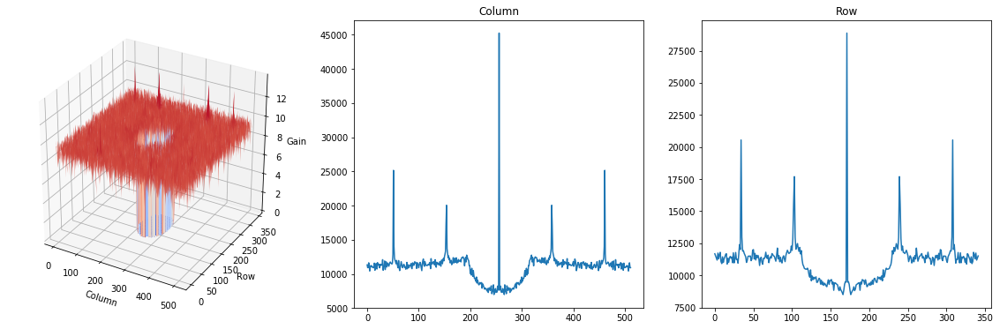

In [ ]:
# Use the results of HPF, which removed removed low frequency
mag_mask= cv2.magnitude(dft_shift_hpf[:,:,0],dft_shift_hpf[:,:,1])

# Search period noise peaks in high frequency area
fig = plt.figure(figsize=(20, 6))
ax = fig.add_subplot(131, projection='3d')
ax.set_xlabel('Column'), ax.set_ylabel('Row'), ax.set_zlabel('Gain')
ax.plot_surface(X, Y, np.log(mag_mask+1), cmap=cm.coolwarm, linewidth=0, antialiased=True)
ax1 = fig.add_subplot(132)
ax1.plot(mag_mask.mean(axis=0))
ax1.title.set_text('Column')
ax2 = fig.add_subplot(133)
ax2.plot(mag_mask.mean(axis=1))
ax2.title.set_text('Row')

In [ ]:
# Manually find noise center from the figures freq_noise = C + t * T
# noise_row, noise_col = [],[]
# for t in range(3):
#     signs = [1, -1] if t >0 else [1]
#     for i in signs:
#         noise_row.append(171 + i * t * 69)
#         noise_col.append(256 + i * t * 103)

# Automatically find noise center in two dimentions
import pandas as pd
noise_col = list(pd.Series(mag_mask.mean(axis=0)).sort_values(ascending=False).head(5).index) # Top 5 highest peak in col
noise_row = list(pd.Series(mag_mask.mean(axis=1)).sort_values(ascending=False).head(5).index) # Top 5 highest peak in row

# generate locations of noise peaks, using col and row location
noise_loc = [[x,y] for x in noise_row for y in noise_col if [x,y]!=[171,256]] # remove the DC center from the list
# row：[34, 103, 171, 239, 308], col: [51, 154, 256, 358, 461]

(<matplotlib.image.AxesImage at 0x16b979a9f98>, None)

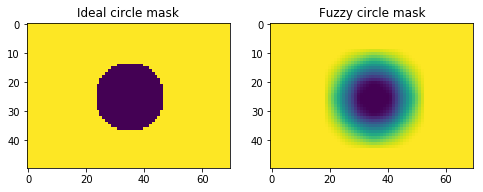

In [ ]:
# Design a notch rejector
# example of a single circle mask
t_row, t_col = 50,70
t_row_c, t_col_c = int(t_row/2), int(t_col/2)
mask = np.ones((t_row, t_col),np.uint8)
x, y = np.ogrid[:t_row, :t_col]

mask_circle = (x-t_row_c)**2 + (y-t_col_c)**2 < 12**2
mask[mask_circle] = 0
kernel = np.ones((12,12),np.float32)/12**2 # use average filter to blur edges of the mask
mask1 = cv2.filter2D(mask.astype("float"),-1,kernel)

fig = plt.figure(figsize=(8, 3))
ax3 = fig.add_subplot(121) 
ax3.imshow(mask), ax3.title.set_text('Ideal circle mask') # ideal circle
ax4 = fig.add_subplot(122) 
ax4.imshow(mask1), ax4.title.set_text('Fuzzy circle mask') # circle with blurry edges

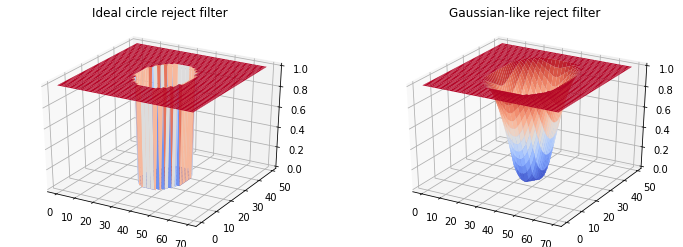

In [ ]:
# show the difference in 3d, the blur-edge circle mask is smoother 
X, Y = np.meshgrid(range(t_col), range(t_row)) # intialise x,y aixs
fig = plt.figure(figsize=(12, 4))
ax1 = fig.add_subplot(121, projection='3d') # ideal 
ax1.plot_surface(X, Y, mask, cmap=cm.coolwarm, linewidth=0, antialiased=True)
ax1.title.set_text('Ideal circle reject filter')
ax2 = fig.add_subplot(122, projection='3d') # Butterworth-like
ax2.plot_surface(X, Y, mask1, cmap=cm.coolwarm, antialiased=True) 
ax2.title.set_text('Gaussian-like reject filter')

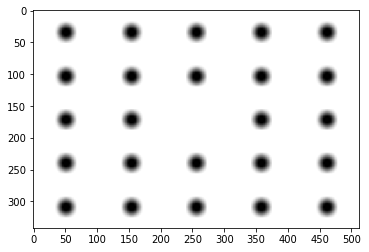

In [ ]:
# for each noise center location, use a Gaussian-like circle reject filter
mask = np.ones((row,col),np.uint8)

r = 12 # radius of circle
x1, y1 = np.ogrid[:row, :col]
for x,y in noise_loc: # for each noise peak center
    mask_circle = (x1-x)**2 + (y1-y)**2 < r**2 # use a circle reject filter
    mask[mask_circle] = 0

# # Use an average filter to blur mask edges (reduce 23 mse comparing to the ideal circle mask)
kernel = np.ones((12,12),np.float32)/12**2 
mask = cv2.filter2D(mask.astype("float"),-1,kernel)

# plt.figure(figsize=(20, 15))
plt.yticks(range(0,row,50), range(0,row,50))
plt.xticks(range(0,col,50), range(0,col,50))
plt.imshow(mask,cmap='gray') # the results shows the peaks are aligned with circles

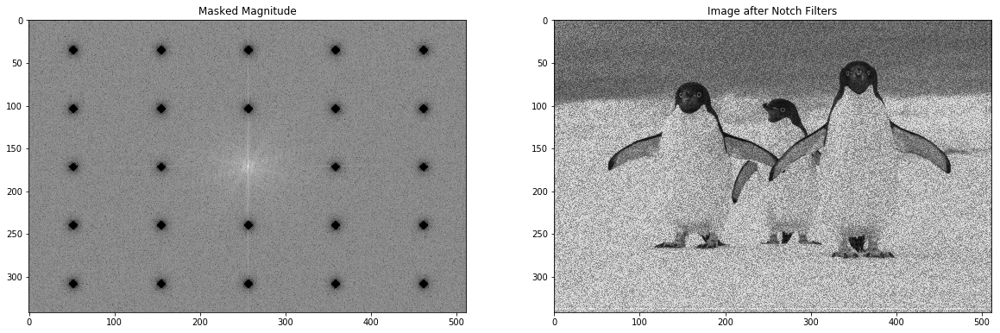

1465.596180654264

In [ ]:
# Apply Notch filters
# reshape the notch mask to [:,:,2], since cv2 dft generate both real/imaginary value
mask_2 = np.array(mask).reshape(row, col, -1) 
mask_2 = np.concatenate([mask_2,mask_2],axis=2) 

dft_shift_mask = dft_shift * mask_2 # apply mask, multmultiplition in frequency domain equals to convolution in spatial domain
mag_notch = np.log(cv2.magnitude(dft_shift_mask[:,:,0],dft_shift_mask[:,:,1])+1) # get the maksed spectrum

dft_ishift = np.fft.ifftshift(dft_shift_mask) # inverse shift

img_notch = cv2.idft(dft_ishift) # inverse Fourier Transform
img_notch = cv2.magnitude(img_notch[:,:,0],img_notch[:,:,1]) # combine real and imaginary value

img_notch = minMaxScaler(img_notch) # normalise min,max to 0,255 

plt.figure(figsize=(20, 15))
plt.subplot(121),plt.imshow(mag_notch, cmap = 'gray')
plt.title('Masked Magnitude')
plt.subplot(122),plt.imshow(img_notch, cmap = 'gray')
plt.title('Image after Notch Filters')
plt.show()
cv2.imwrite("img_notch.bmp", img_notch) # save image
# mse(img_notch,img_orig),ssim(img_notch,img_orig) #(1399.4002468143221, 0.1772306921831056)
mse(img_notch, minMaxScaler(img_orig))

# Denoising and Smoothing

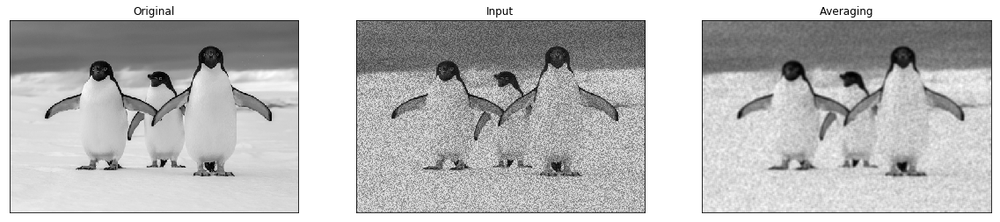

MSE: 767.1087215070988 Scaled MSE: 142.9509069748064
NRMSE: 0.17575243284677589 Scaled NRMSE: 0.06549554456941209
SSIM: 0.7075343802297419 Scaled SSIM: 0.6382886911516223
PSNR: 19.16074321318089 Scaled PSNR: 26.59799844528196
IQA sharpness: 0.8971871818833259 Scaled Sharpness: 0.8908665138860251 Ref: 0.857711518054563
Brisque: 31.144090323901736 Scaled Brisque: 31.283815407717242 Ref: 8.180074429275436


In [ ]:
# Average smoothing
kernel = np.ones((5,5),np.float32)/25
dst = cv2.filter2D(img_notch,-1,kernel)

plt.figure(figsize=(20,12))
plt.subplot(131),plt.imshow(img_orig, cmap='gray'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(img_notch, cmap='gray'),plt.title('Input')
plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(dst, cmap='gray'),plt.title('Averaging')
plt.xticks([]), plt.yticks([])
plt.show()
printAll(dst, img_orig)

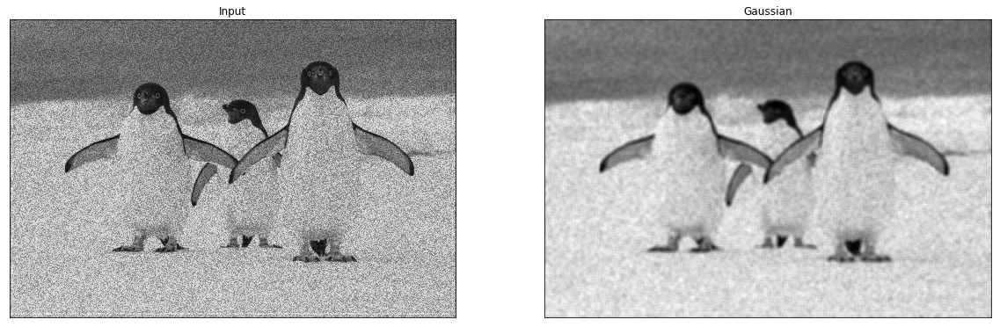

MSE: 764.9697499946851 Scaled MSE: 140.90621266203527
NRMSE: 0.17550217535668317 Scaled NRMSE: 0.06499870660133054
SSIM: 0.7093482504150905 Scaled SSIM: 0.6403994451632798
PSNR: 19.172629406825326 Scaled PSNR: 26.662742342784647
IQA sharpness: 0.9032662173959146 Scaled Sharpness: 0.898987861890172 Ref: 0.857711518054563
Brisque: 32.85001185052883 Scaled Brisque: 32.97448176573582 Ref: 8.180074429275436


In [ ]:
# Gaussian Filtering
img_g = cv2.GaussianBlur(img_notch,(5,5),5)

plt.figure(figsize=(20, 12))
plt.subplot(121),plt.imshow(img_notch, cmap='gray'),plt.title('Input')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(img_g, cmap='gray'),plt.title('Gaussian')
plt.xticks([]), plt.yticks([])
plt.show()
printAll(img_g, img_orig)

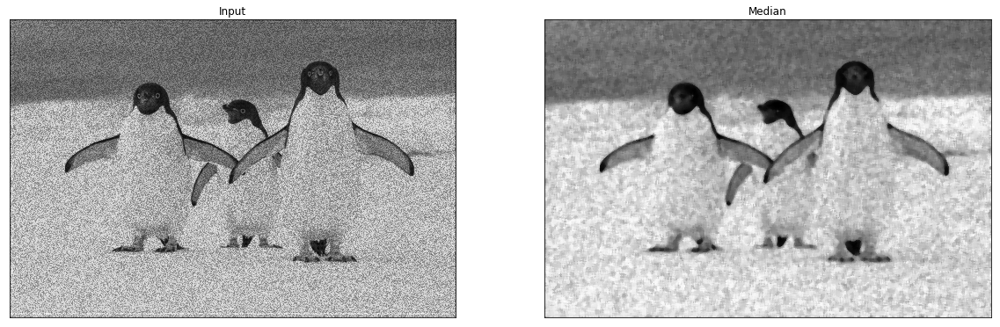

MSE: 674.8611383535506 Scaled MSE: 221.77665743614077
NRMSE: 0.1622042072172557 Scaled NRMSE: 0.08226990370338912
SSIM: 0.5321547547285419 Scaled SSIM: 0.4530463641015365
PSNR: 19.71247343029046 Scaled PSNR: 24.636316162277495
IQA sharpness: 1.0279545501876572 Scaled Sharpness: 1.029897903983406 Ref: 0.857711518054563
Brisque: 37.8371684125901 Scaled Brisque: 38.07969849872515 Ref: 8.180074429275436


In [ ]:
# Median
img_median = cv2.medianBlur(img_notch.astype(np.float32),5)

plt.figure(figsize=(20, 12))
plt.subplot(121),plt.imshow(img_notch, cmap='gray'),plt.title('Input')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(img_median, cmap='gray'),plt.title('Median')
plt.xticks([]), plt.yticks([])
plt.show()
printAll(img_median, img_orig)

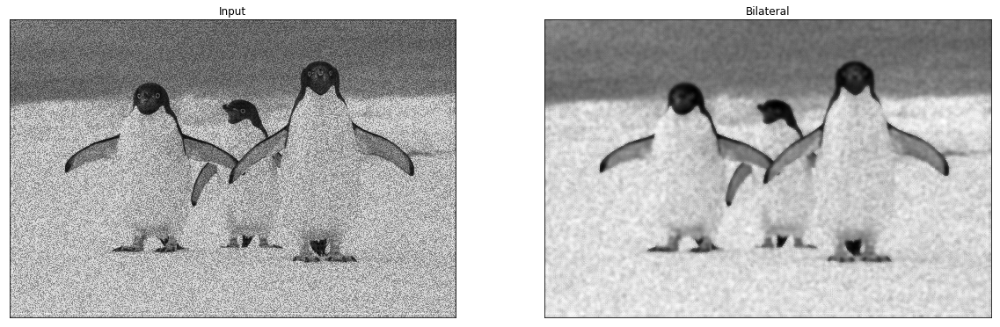

MSE: 729.4038609681546 Scaled MSE: 125.92535934949257
NRMSE: 0.17103406008068447 Scaled NRMSE: 0.06100354265615331
SSIM: 0.6878955456944759 Scaled SSIM: 0.6124375446767554
PSNR: 19.37455625729148 Scaled PSNR: 27.19051029808197
IQA sharpness: 0.8854737220131481 Scaled Sharpness: 0.8782814345589276 Ref: 0.857711518054563
Brisque: 63.108447316431096 Scaled Brisque: 63.39900452020831 Ref: 8.180074429275436


In [ ]:
# Bilateral Filtering
blur_bil = cv2.bilateralFilter(img_notch.astype(np.float32),7,90,90)

plt.figure(figsize=(20, 12))
plt.subplot(121),plt.imshow(img_notch, cmap='gray'),plt.title('Input'),plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(blur_bil, cmap='gray'),plt.title('Bilateral'),plt.xticks([]), plt.yticks([])
plt.show()
printAll(blur_bil, img_orig)

MSE: 126.26304882713123 Scaled MSE: 126.64763347392214
NRMSE: 0.060940245873278384 Scaled NRMSE: 0.0610090539304803
SSIM: 0.7041889630116862 Scaled SSIM: 0.7040346061467468
PSNR: 27.200414165171615 Scaled PSNR: 27.189183846322337
IQA sharpness: 0.8856170235791652 Scaled Sharpness: 0.8854609946098505 Ref: 0.857711518054563
Brisque: 51.44345017705527 Scaled Brisque: 51.445736708122894 Ref: 8.180074429275436


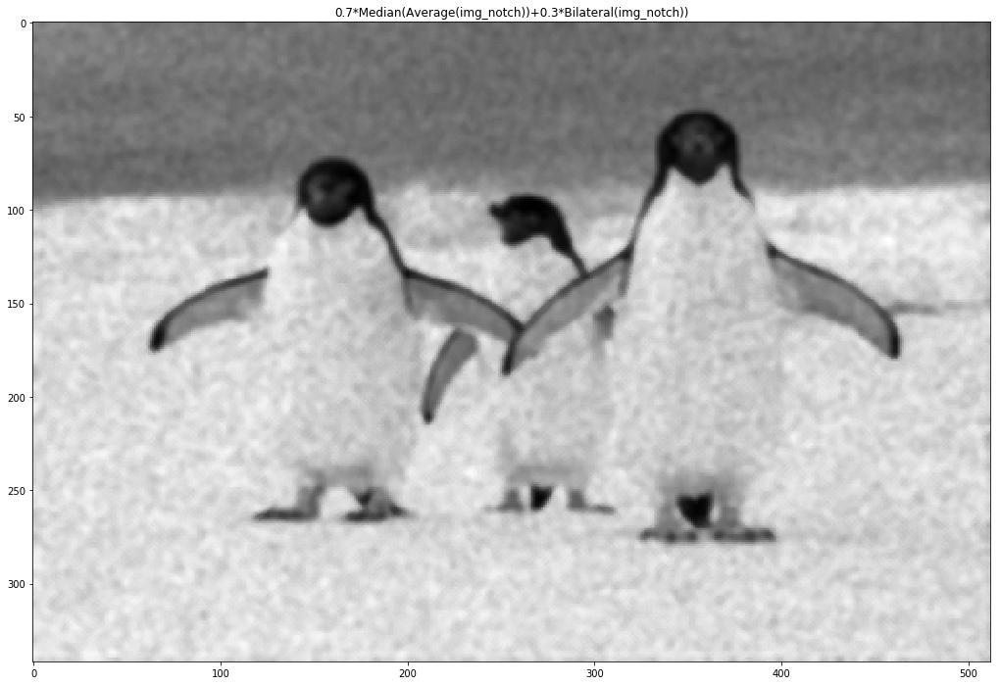

In [ ]:
# Combine various filters, 0.7 * Median(Average(img)) + 0.3 * Bilateral(Notch(img))
blur_bil = cv2.bilateralFilter(img_notch.astype(np.float32),7,90,90)
# blur_ga =  cv2.GaussianBlur(dst, (3, 3), 0, 0)
blur_med = cv2.medianBlur(dst.astype(np.float32),3)
img_smooth = 0.70 * minMaxScaler(blur_med) + 0.30 * minMaxScaler(blur_bil)

plt.figure(figsize=(20, 12))
plt.imshow(img_smooth, cmap = 'gray')
plt.title("0.7*Median(Average(img_notch))+0.3*Bilateral(img_notch))")
cv2.imwrite('img_smooth.bmp', img_smooth)
printAll(img_smooth,img_orig)

In [ ]:
# save the img
import pickle
output = img_smooth
with open(f'{PATH}outputImg_smooth.pickle', 'wb') as handle:
    pickle.dump(output, handle, protocol=pickle.HIGHEST_PROTOCOL)

MSE: 701.1753254325174 Scaled MSE: 73.8096438753012
NRMSE: 0.1678470849693765 Scaled NRMSE: 0.04679083505014592
SSIM: 0.808329082771328 Scaled SSIM: 0.7730176211640465
PSNR: 19.54064063757122 Scaled PSNR: 29.539930154709992
IQA sharpness: 0.8891735123305124 Scaled Sharpness: 0.889804535926806 Ref: 0.857711518054563
Brisque: 60.03759829606199 Scaled Brisque: 60.15531299354777 Ref: 8.180074429275436


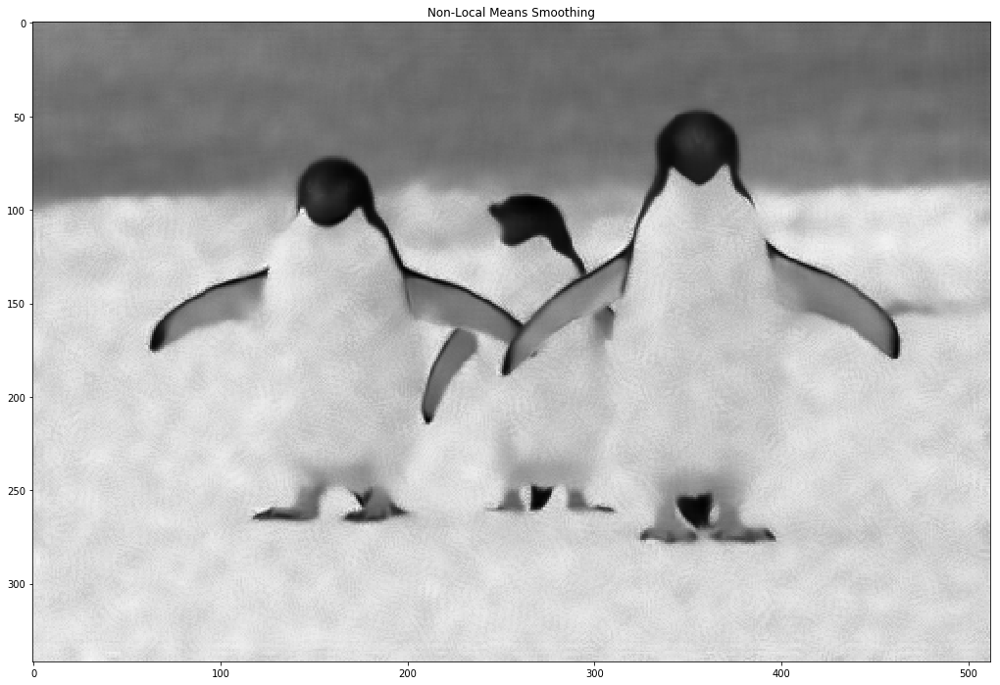

In [ ]:
# Non-local means method
from skimage import io, img_as_float
from skimage.restoration import denoise_nl_means, estimate_sigma
def de_nlm(img):
    sigma_est = np.mean(estimate_sigma(img, multichannel=False)) # estimate sigma value from the image
    return denoise_nl_means(img, h=1.15* sigma_est, fast_mode=True, patch_size=6, patch_distance=5, multichannel=False)

img_nlm = de_nlm(img_notch)
plt.figure(figsize=(20, 12))
plt.imshow(img_nlm, cmap='gray')
plt.title('Non-Local Means Smoothing')
cv2.imwrite('img_nlm.bmp', minMaxScaler(img_nlm))
printAll(img_nlm, img_orig)

MSE: 709.5594437695028 Scaled MSE: 111.40356569027018
NRMSE: 0.16898302860168557 Scaled NRMSE: 0.056243456818853114
SSIM: 0.8178276849175795 Scaled SSIM: 0.7755610612310697
PSNR: 19.48948754858802 Scaled PSNR: 27.84311205672133
IQA sharpness: 1.0729915780603794 Scaled Sharpness: 1.0661372055702356 Ref: 0.857711518054563
Brisque: 20.643395229739866 Scaled Brisque: 20.625225111929325 Ref: 8.180074429275436


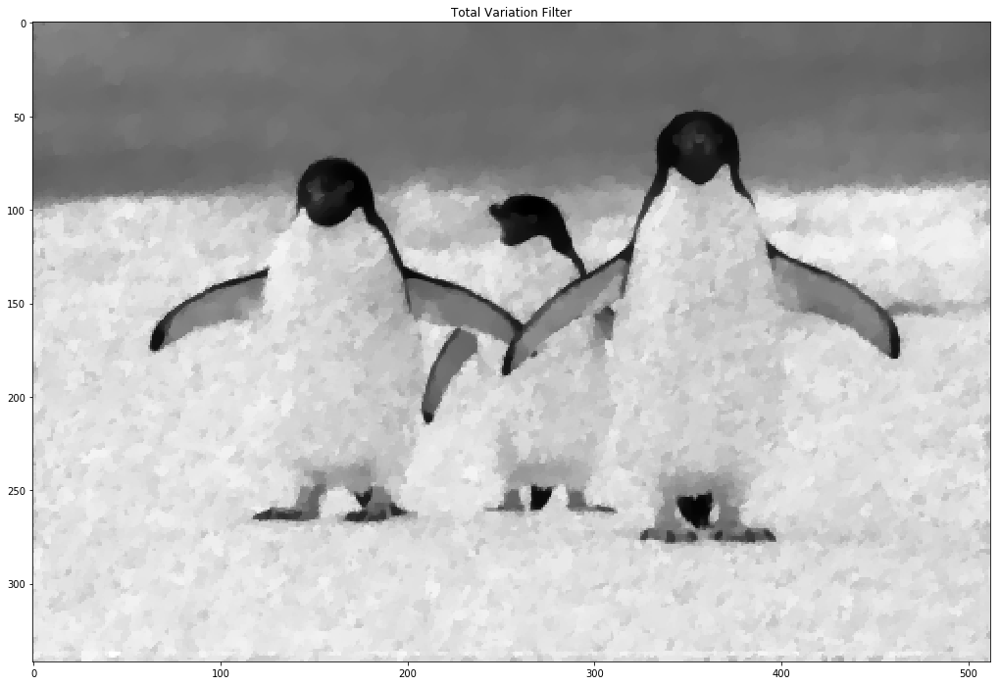

In [ ]:
# Total Variation Filter (TVF)
from skimage.restoration import denoise_tv_chambolle
def de_tvf(img):
    return denoise_tv_chambolle(img, weight=22, eps=1e-5, n_iter_max=300, multichannel=False)
img_tvf = de_tvf(img_notch)
plt.figure(figsize=(20, 12))
plt.imshow(img_tvf, cmap='gray')
plt.title('Total Variation Filter')
cv2.imwrite('img_tvf.bmp', minMaxScaler(img_tvf))
printAll(img_tvf, img_orig)

MSE: 674.2609588495898 Scaled MSE: 90.69082368812829
NRMSE: 0.16412306940763638 Scaled NRMSE: 0.051311442791330465
SSIM: 0.7466989989690347 Scaled SSIM: 0.6963213765697549
PSNR: 19.70692596935657 Scaled PSNR: 28.732554374589185
IQA sharpness: 0.9428701482192021 Scaled Sharpness: 0.9388453922555782 Ref: 0.857711518054563
Brisque: 71.73408354782194 Scaled Brisque: 71.78919233823743 Ref: 8.180074429275436


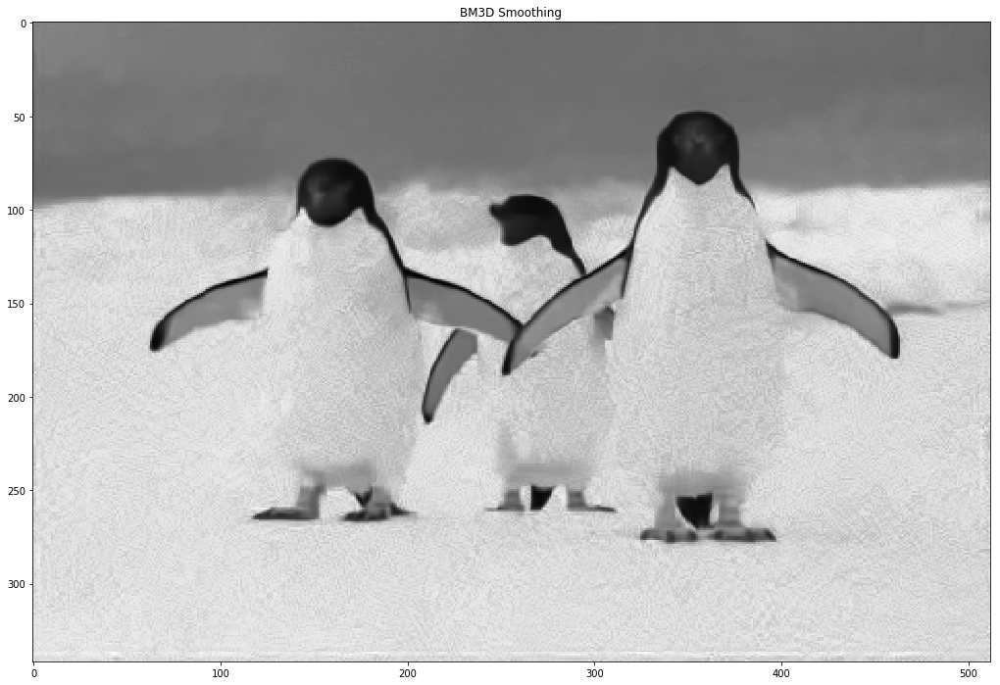

In [ ]:
# Block Matching & 3D filtering (BM3D)
# BM3D is an algorithm for attenuation of additive spatially correlated stationary Gaussian noise
# https://pypi.org/project/bm3d/#description
import bm3d
sigma_est = estimate_sigma(img_notch, average_sigmas=True) # estimate sigma is 26.59
img_bm3d = bm3d.bm3d(img_notch, sigma_psd=0.9 * sigma_est, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)
plt.figure(figsize=(20, 12))
plt.imshow(img_bm3d, cmap='gray')
plt.title("BM3D Smoothing")
cv2.imwrite('img_bm3d.bmp', minMaxScaler(img_bm3d))
printAll(img_bm3d, img_orig)

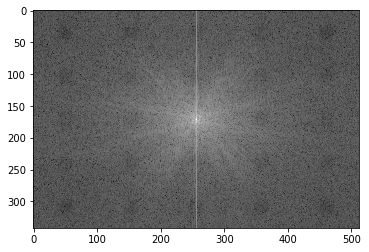

In [ ]:
plt.imshow(get_cfft_mag(img_comb), cmap = 'gray') # check the spectrum of the final result

# All Output Images and Results 

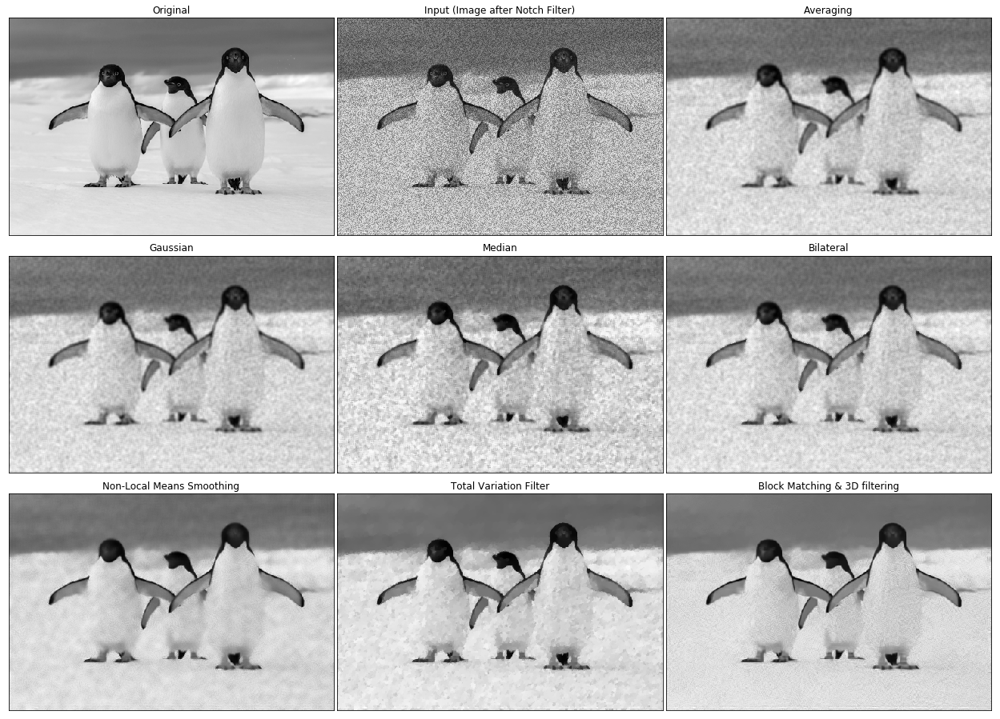

In [ ]:
# print it all
fig=plt.figure(figsize=(22,16))
fig.tight_layout()#调整整体空白
plt.subplots_adjust(wspace=0.01, hspace=0.08)
plt.subplot(331),plt.imshow(img_orig, cmap='gray'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(332),plt.imshow(img_notch, cmap='gray'),plt.title('Input (Image after Notch Filter)')
plt.xticks([]), plt.yticks([])
plt.subplot(333),plt.imshow(dst, cmap='gray'),plt.title('Averaging')
plt.xticks([]), plt.yticks([])
plt.subplot(334),plt.imshow(img_g, cmap='gray'),plt.title('Gaussian')
plt.xticks([]), plt.yticks([])
plt.subplot(335),plt.imshow(img_median, cmap='gray'),plt.title('Median')
plt.xticks([]), plt.yticks([])
plt.subplot(336),plt.imshow(blur_bil, cmap='gray'),plt.title('Bilateral')
plt.xticks([]), plt.yticks([])
plt.subplot(337),plt.imshow(img_nlm, cmap='gray'),plt.title('Non-Local Means Smoothing')
plt.xticks([]), plt.yticks([])
plt.subplot(338),plt.imshow(img_tvf, cmap='gray'),plt.title('Total Variation Filter')
plt.xticks([]), plt.yticks([])
plt.subplot(339),plt.imshow(img_bm3d, cmap='gray'),plt.title('Block Matching & 3D filtering')
plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
img_list = [img_orig,img, img_low, img_notch, dst, img_g, img_median, blur_bil, img_nlm, img_tvf, img_bm3d]
df_res = getAll(img_list, img_orig)
df_res['Image/Filter'] = ['Original (Reference)','Distorted', 'LPF', 'Notch Filters (NF)', 'NF+Averaging','NF+Gaussian','NF+Median','NF+Bilateral','NF+NLM','NF+TVF','NF+BM3D']
df_res.index = df_res['Image/Filter']
df_res

,MSE,NRMSE,SSIM,PSNR,DOM (Non-Ref),Brisque (Non-Ref)
Image/Filter,,,,,,
Original (Reference),0.000000,0.000000,1.000000,inf,0.857507,8.17769
Distorted,1637.009871,0.234940,0.126114,15.996510,1.130166,132.026
LPF,227.162683,0.083925,0.590484,24.588598,0.933454,46.2698
Notch Filters (NF),1471.660732,0.239511,0.177210,16.477418,1.006634,Error
NF+Averaging,144.644312,0.065882,0.640680,26.553858,0.890867,31.2838
NF+Gaussian,142.366627,0.065335,0.642782,26.622343,0.898988,32.9745
NF+Median,228.501845,0.083508,0.455481,24.564461,1.029898,38.0797
NF+Bilateral,123.425726,0.060395,0.614931,27.226553,0.878281,63.399
NF+NLM,71.888795,0.046178,0.774567,29.584834,0.889805,60.1553


# Evaluate on Histogram

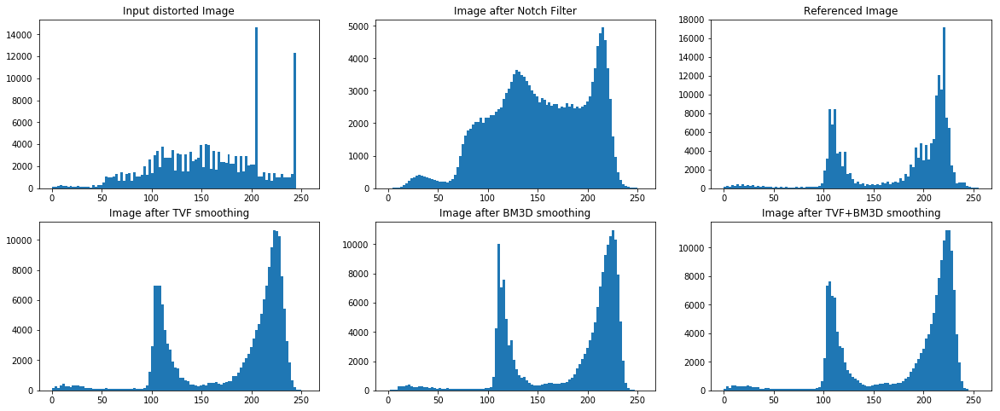

In [ ]:
plt.figure(figsize=(20, 8))
plt.subplot('231')
plt.hist(img.flat, bins=100, range=(0,255))
plt.title('Input distorted Image')
plt.subplot('232')
plt.hist(minMaxScaler(img_notch).flat, bins=100, range=(0,255))
plt.title('Image after Notch Filter')
plt.subplot('233')
plt.hist(minMaxScaler(img_orig).flat, bins=100, range=(0,255))
plt.title('Referenced Image')
plt.subplot('234')
plt.hist(minMaxScaler(img_tvf).flat, bins=100, range=(0,255))
plt.title('Image after TVF smoothing')
plt.subplot('235')
plt.hist(minMaxScaler(img_bm3d).flat, bins=100, range=(0,255))
plt.title('Image after BM3D smoothing')
plt.subplot('236')
plt.hist(minMaxScaler(img_comb).flat, bins=100, range=(0,255))
plt.title('Image after TVF+BM3D smoothing')
plt.show()

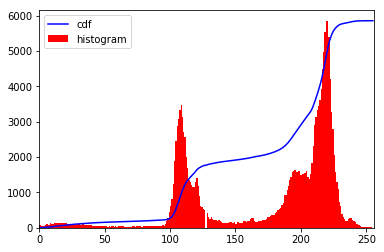

In [ ]:
def getHist(img):
    img = minMaxScaler(img)
    hist,bins = np.histogram(img.flatten(),256,[0,256])
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max()/ cdf.max()
    plt.plot(cdf_normalized, color = 'b')
    plt.hist(img.flatten(),256,[0,256], color = 'r')
    plt.xlim([0,256])
    plt.legend(('cdf','histogram'), loc = 'upper left')
    plt.show()
getHist(img_orig)

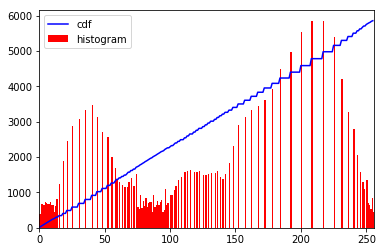

In [ ]:
getHist(cv2.equalizeHist(img_orig.astype('uint8')))

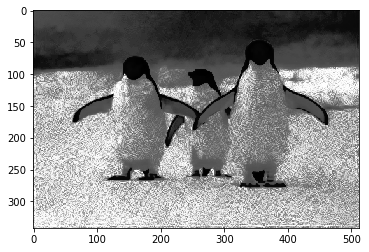

In [ ]:
plt.imshow(cv2.equalizeHist(img_bm3d.astype('uint8')),cmap='gray')

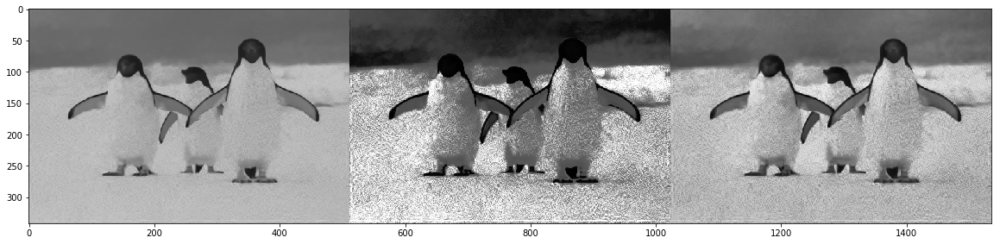

In [ ]:
equ = cv2.equalizeHist(img_bm3d.astype('uint8'))
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(5,5))
cl1 = clahe.apply(img_bm3d.astype('uint8'))
res = np.hstack((img_bm3d,equ,cl1))
plt.figure(figsize=(20, 8))
plt.imshow(res,cmap='gray')

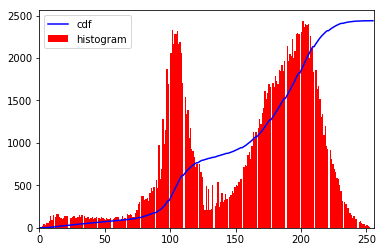

In [ ]:
getHist(cl1)

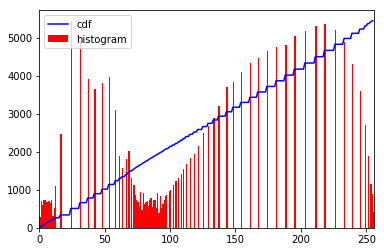

In [ ]:
getHist(equ)

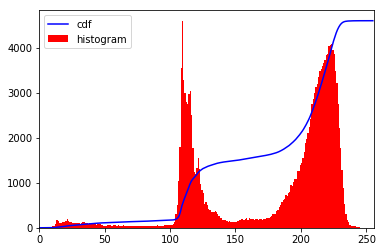

In [ ]:
getHist(img_bm3d)

# New Quality Evaluation

In [ ]:
# Quality Evaluation function
def testNoise(img):
    img = minMaxScaler(img)
    # compare with low frequency (sensitive to noise)
    kernel = np.ones((5,5),np.float32)/5**2 #average filter
    low = minMaxScaler(cv2.filter2D(img,-1,kernel)) # low frequency, miniumum noise
    low_avg = nrmse(low, img) # average of difference, Higher value -> more noise
    low_ssim = ssim(low, img) # structural similarity between low freq and high freq part. Higher value -> less noise
    
    # compare with high frequency (sensitive to blur)
    kernel = np.array([[0,-1, 0],[-1,5,-1],[0,-1,0]],np.float32) # sharp filter
    high = minMaxScaler(cv2.filter2D(img,-1,kernel)) # high frequency, noise 
    high_avg = nrmse(high, img)  # average of difference. Higher value -> more detail
    high_ssim = ssim(high, img) # similarity betwen high freq and blur part. Higher value -> less blur
    
    # average score
    diff = (low_avg + high_avg)/2
    _ssim = (low_ssim + high_ssim)/2
    # combine difference value with similarity value to form a single score
    score = diff * (1/_ssim)  # Lower value -> more balance in high and low frequency (less noise and blur) 
    print(score)
testNoise(minMaxScaler(img)),testNoise(minMaxScaler(img_notch)),testNoise(minMaxScaler(img_nlm)),testNoise(minMaxScaler(img_orig)),testNoise(minMaxScaler(img_bm3d))


0.32813158127819747 -0.09684905156460977 0.3599108137133865
0.3018809406355736 -0.1409661097196235 0.344435922435471
0.23318313411199498 0.27957524324310623 0.16799090267244413
0.1961088458746994 0.37555187175226157 0.12245980173928026


(None, None, None, None)

0.21465032774704507 -0.014697342225747204 0.2178051170728122


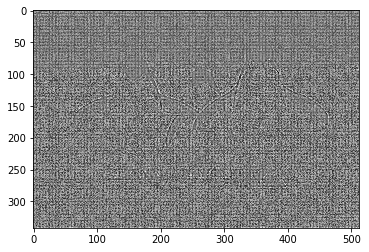

In [ ]:
    plt.imshow(img_high, cmap='gray')
    testNoise(img_high)

0.2816138342303692 -0.27663446774591977 0.35951792737257504


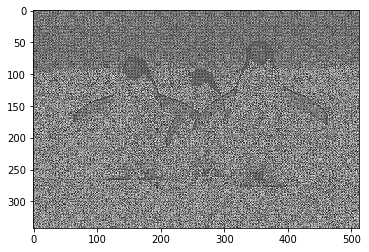

In [ ]:
    kernel = np.array([[0,-1, 0],[-1,5,-1],[0,-1,0]],np.float32)
    high = minMaxScaler(cv2.filter2D(img,-1,kernel))
    plt.imshow(high, cmap='gray')
    testNoise(high)

In [ ]:
blur = cv2.GaussianBlur(img,(25,25),0)
testNoise(blur)

0.03259659944268256 0.45028358642780897 0.01791888574028074


In [ ]:
kernel = np.ones((20,20),np.float32)/20**2
sblur = minMaxScaler(cv2.filter2D(img,-1,kernel))
testNoise(sblur)

0.04211083242137313 0.4966765583298417 0.02119536910592081


In [ ]:
kernel = np.ones((5,5),np.float32)/25
sblur = minMaxScaler(cv2.filter2D(img,-1,kernel))
testNoise(sblur)

0.11096738495402109 0.21348828451941312 0.08727714830258179


In [ ]:
kernel = np.ones((3,3),np.float32)/9
sblur = minMaxScaler(cv2.filter2D(img,-1,kernel))
testNoise(sblur)

0.18045827174315832 0.015563574768243299 0.1776496959383357


MSE: 86.97701343729308 Scaled MSE: 86.73439899347557
NRMSE: 0.04998091102322709 Scaled NRMSE: 0.050023587611174626
SSIM: 0.7604836765542373 Scaled SSIM: 0.7547418185068735
PSNR: 28.94658764721242 Scaled PSNR: 28.91447265134311
IQA sharpness: 0.9967849239021176 Scaled Sharpness: 0.9954772557382614 Ref: 0.857711518054563
Brisque: 42.81700765190325 Scaled Brisque: 42.83011653780213 Ref: 8.180074429275436


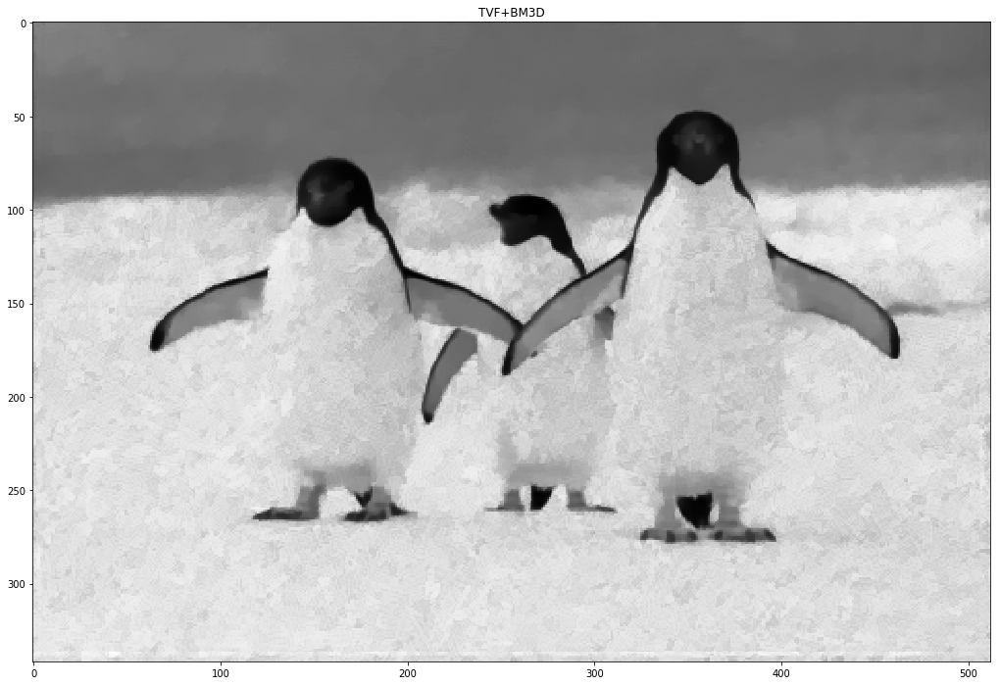

In [ ]:
# combine the best 2 results, tvf+bm3d
# change different weights to get the best quality score
img_comb= 0.5 * (minMaxScaler(img_bm3d)+ 0.5 * minMaxScaler(img_tvf))
plt.figure(figsize=(20, 12))
plt.imshow(img_comb, cmap='gray')
plt.title("TVF+BM3D")
cv2.imwrite('img_comb_tvf_bm3d.bmp', img_comb)
printAll(img_comb, img_orig)